# our test data

## google earth data

we captured some images from Google Earth (Sudbury MA atkinson pool area)

## actual HAB data

we use some images that we capture from another HAB flight, from youtube. It has footage from a downward facing camera.

- we took screenshots from the flight footage from youtube
- we found the exact location of the launch site, and took screenshots from the google earth view for that location


In [5]:
import os
from IPython.display import display, HTML, Image

# Specify the directory containing images
folder_path = 'images'

# List all files in the folder
files = os.listdir(folder_path)

# Filter for image files (assuming PNG and JPG files)
image_files = [f for f in files if f.endswith('.png') or f.endswith('.jpg')]

# Start the HTML table
html = "<table><tr>"

# Counter to keep track of when to insert a new table row
count = 0

# Display each image in a table cell
for image_file in image_files:
    # Wrap around every 4 images
    if count % 4 == 0 and count != 0:
        html += "</tr><tr>"
    
    # Add image cell
    image_path = os.path.join(folder_path, image_file)
    html += f"<td style='padding:10px'><img src='{image_path}' width='150' height='150'></td>"
    
    count += 1

# Close the last row and the table
html += "</tr></table>"

# Display the HTML table with the images
display(HTML(html))

# image mapping

let's try mapping 2 images.

we take our atkinson pool screen shot (call it the 'reference'), we take a slightly rotated version of the same screenshoot (call it the 'capture'), and we see if we can find features and match the features.



libpng warning: iCCP: extra compressed data


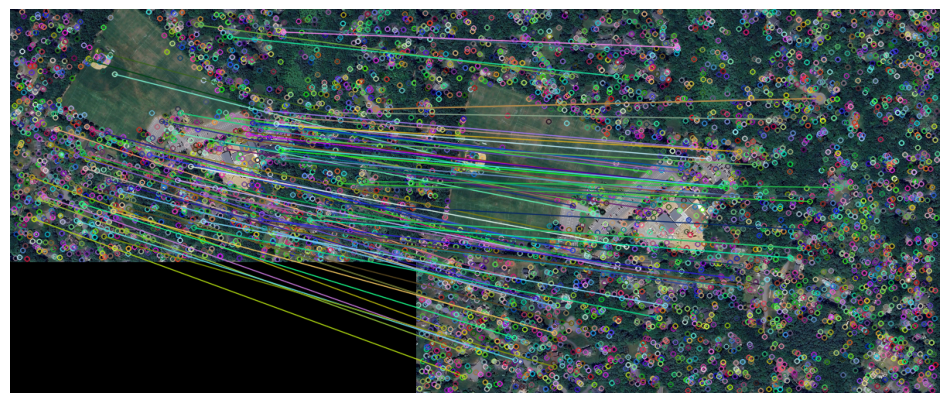

In [14]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Set parameters
BLUR_KERNEL_SIZE = (3, 3)  # Kernel size for Gaussian blur (denoising)
DOWNSAMPLE_FACTOR = 0.3    # Factor to downsample the images
LOWES_RATIO_THRESHOLD = 0.1  # Lowe's ratio test threshold

# Load the images
referenceImage = cv2.imread('images/2010 atkinson pool.png')
capturedImage = cv2.imread('images/2023 atkinson rotated.png')

#/Users/kids/Downloads/santa_nella_historical/santa_nella_satellite_2024.png
#/Users/kids/Downloads/santa_nella_historical/santa_nella_satellite_2009.png
#/Users/kids/Downloads/santa_nella_historical/santa_nella_satellite_2010.png
#/Users/kids/Downloads/santa_nella_historical/santa_nella_satellite_2011.png
#/Users/kids/Downloads/santa_nella_historical/santa_nella_satellite_2013.png

#referenceImage = cv2.imread('/Users/kids/Jupyter_notebook/Hab/santa_nella_satellite_2024.png')
#capturedImage = cv2.imread('/Users/kids/Jupyter_notebook/Hab/santanella_balloon.png')


# Apply Gaussian Blur for de-noising
capturedImageBlurred = cv2.GaussianBlur(capturedImage, BLUR_KERNEL_SIZE, 0)
referenceImageBlurred = cv2.GaussianBlur(referenceImage, BLUR_KERNEL_SIZE, 0)

# Downsample images to reduce resolution and emphasize significant features
capturedImageBlurredResized = cv2.resize(capturedImageBlurred, (0,0), fx=DOWNSAMPLE_FACTOR, fy=DOWNSAMPLE_FACTOR)
referenceImageBlurredResized = cv2.resize(referenceImageBlurred, (0,0), fx=DOWNSAMPLE_FACTOR, fy=DOWNSAMPLE_FACTOR)

# Convert images to grayscale
capGray = cv2.cvtColor(capturedImageBlurredResized, cv2.COLOR_BGR2GRAY)
refGray = cv2.cvtColor(referenceImageBlurredResized, cv2.COLOR_BGR2GRAY)

# Initialize SIFT detector
sift = cv2.SIFT_create()

# Find the keypoints and descriptors with SIFT
capKeypoints, capDescriptors = sift.detectAndCompute(capGray, None)
refKeypoints, refDescriptors = sift.detectAndCompute(refGray, None)

# FLANN parameters
FLANN_INDEX_KDTREE = 1
index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
search_params = dict(checks=50)
flann = cv2.FlannBasedMatcher(index_params, search_params)

# Perform the matching
matches = flann.knnMatch(capDescriptors, refDescriptors, k=2)

# Apply Lowe's ratio test to find good matches
good_matches = [m for m, n in matches if m.distance < LOWES_RATIO_THRESHOLD * n.distance]

# Prepare to draw matches
img_matches = cv2.drawMatches(capturedImageBlurredResized, capKeypoints, referenceImageBlurredResized, refKeypoints, good_matches, None)

# Convert BGR to RGB for displaying with matplotlib
img_matches = cv2.cvtColor(img_matches, cv2.COLOR_BGR2RGB)

# Use matplotlib to display the image
plt.figure(figsize=(12, 6))
plt.imshow(img_matches)
plt.axis('off')  # Hide the axes
plt.show()


# Nicer colors

Now, let's make a version that shows all features in a single color, and plots the matches in a gradient, brighter for better matches.


libpng warning: iCCP: extra compressed data


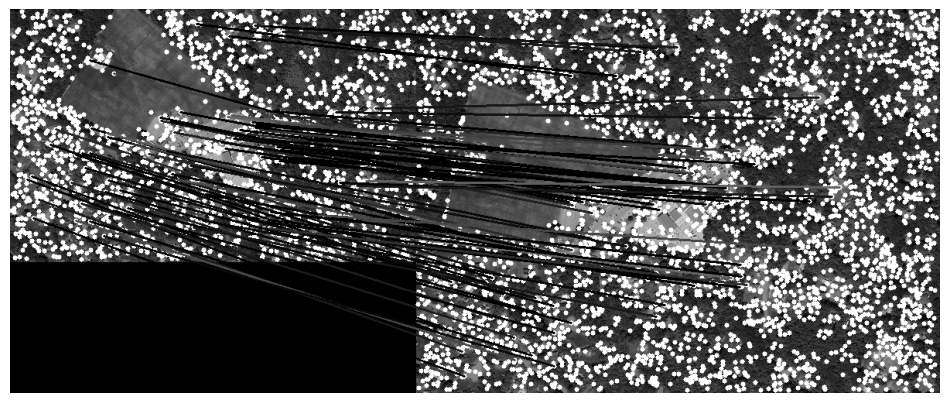

In [16]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Set parameters
BLUR_KERNEL_SIZE = (3, 3)  # Kernel size for Gaussian blur (denoising)
DOWNSAMPLE_FACTOR = 0.3    # Factor to downsample the images
LOWES_RATIO_THRESHOLD = 0.1  # Lowe's ratio test threshold

# Load the images
referenceImage = cv2.imread('images/2010 atkinson pool.png')
capturedImage = cv2.imread('images/2023 atkinson rotated.png')

# Apply Gaussian Blur for de-noising
capturedImageBlurred = cv2.GaussianBlur(capturedImage, BLUR_KERNEL_SIZE, 0)
referenceImageBlurred = cv2.GaussianBlur(referenceImage, BLUR_KERNEL_SIZE, 0)

# Downsample images to reduce resolution and emphasize significant features
capturedImageBlurredResized = cv2.resize(capturedImageBlurred, (0,0), fx=DOWNSAMPLE_FACTOR, fy=DOWNSAMPLE_FACTOR)
referenceImageBlurredResized = cv2.resize(referenceImageBlurred, (0,0), fx=DOWNSAMPLE_FACTOR, fy=DOWNSAMPLE_FACTOR)

# Convert images to grayscale if they are not already
if len(capturedImageBlurredResized.shape) == 3:
    capGray = cv2.cvtColor(capturedImageBlurredResized, cv2.COLOR_BGR2GRAY)
else:
    capGray = capturedImageBlurredResized

if len(referenceImageBlurredResized.shape) == 3:
    refGray = cv2.cvtColor(referenceImageBlurredResized, cv2.COLOR_BGR2GRAY)
else:
    refGray = referenceImageBlurredResized

# Initialize SIFT detector
sift = cv2.SIFT_create()

# Find the keypoints and descriptors with SIFT
capKeypoints, capDescriptors = sift.detectAndCompute(capGray, None)
refKeypoints, refDescriptors = sift.detectAndCompute(refGray, None)

# FLANN parameters
FLANN_INDEX_KDTREE = 1
index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
search_params = dict(checks=50)
flann = cv2.FlannBasedMatcher(index_params, search_params)

# Perform the matching
matches = flann.knnMatch(capDescriptors, refDescriptors, k=2)

# Apply Lowe's ratio test to find good matches
good_matches = [m for m, n in matches if m.distance < LOWES_RATIO_THRESHOLD * n.distance]

# Prepare to draw custom matches
# Create an output image by placing the two images side by side
h1, w1 = capGray.shape[:2]
h2, w2 = refGray.shape[:2]
output_image = np.zeros((max(h1, h2), w1 + w2), dtype=np.uint8)
output_image[:h1, :w1] = capGray
output_image[:h2, w1:w1 + w2] = refGray

# Draw all keypoints in blue
for kp in capKeypoints:
    pt = (int(kp.pt[0]), int(kp.pt[1]))
    cv2.circle(output_image, pt, 3, 255, -1)  # Draw in white on grayscale
for kp in refKeypoints:
    pt = (int(kp.pt[0] + w1), int(kp.pt[1]))
    cv2.circle(output_image, pt, 3, 255, -1)  # Draw in white on grayscale

# Draw matches with varying color intensity
for match in good_matches:
    # Use match distance to determine the color intensity (lower distance = stronger match)
    color_intensity = 255 - int(match.distance * 10) if match.distance < 25 else 0
    pt1 = (int(capKeypoints[match.queryIdx].pt[0]), int(capKeypoints[match.queryIdx].pt[1]))
    pt2 = (int(refKeypoints[match.trainIdx].pt[0] + w1), int(refKeypoints[match.trainIdx].pt[1]))
    cv2.line(output_image, pt1, pt2, color_intensity, 2)  # Gray intensity for stronger matches

# Use matplotlib to display the image
plt.figure(figsize=(12, 6))
plt.imshow(output_image, cmap='gray')
plt.axis('off')  # Hide the axes
plt.show()


# image registration

let's try our hand at a slightly harder problem: registering 2 images.

we take our atkinson pool screen shot (call it the 'reference')
we take a slightly rotated version of the same screenshoot (call it the 'capture')
we see if our script can 'register' them, i.e. map the captured image to the original image

for this, we need to:
- recognize features on the reference and capture image
- map the features between the images, to find matches
- use the matches to find how we transform (rotate, shift, warp) from capture to reference
- actually transform the captured image to the shape, form, orientation of the reference image
    
    
by doing this, we have a method that hopefully will take balloon images, and map them onto reference satellite immages 





libpng warning: iCCP: extra compressed data


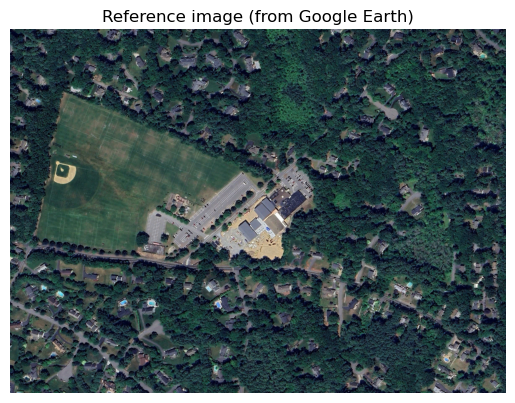

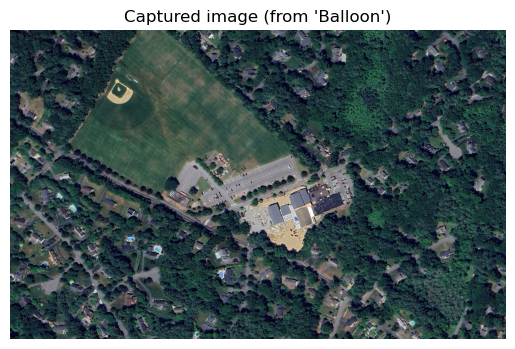

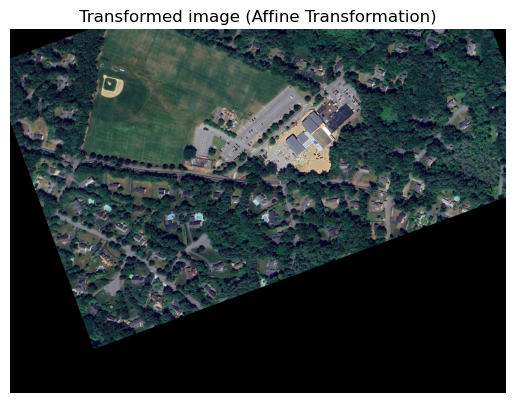

In [18]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Function to convert a BGR image to RGB for displaying correctly with matplotlib
def show_image(img, title="Image", cmap_type=None):
    if len(img.shape) == 3:  # Color image
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    else:  # Grayscale image
        img_rgb = img
        cmap_type = 'gray'
    plt.imshow(img_rgb, cmap=cmap_type)
    plt.title(title)
    plt.axis('off')  # Turn off axis numbers and ticks
    plt.show()

# set parameters
BLUR_KERNEL_SIZE = (3, 3) # Kernel size for Gaussian blur (denoising)
DOWNSAMPLE_FACTOR = 0.3 # Factor to downsample the images (0.5 reduces the resolution to half)
LOWES_RATIO_THRESHOLD = 0.1 # Lowe's ratio test threshold

# Load the images
referenceImage = cv2.imread('images/2010 atkinson pool.png')
capturedImage = cv2.imread('images/2023 atkinson rotated.png')

#/Users/kids/Downloads/santa_nella_historical/santa_nella_satellite_2024.png
#/Users/kids/Downloads/santa_nella_historical/santa_nella_satellite_2009.png
#/Users/kids/Downloads/santa_nella_historical/santa_nella_satellite_2010.png
#/Users/kids/Downloads/santa_nella_historical/santa_nella_satellite_2011.png
#/Users/kids/Downloads/santa_nella_historical/santa_nella_satellite_2013.png

#referenceImage = cv2.imread('/Users/kids/Jupyter_notebook/Hab/santa_nella_satellite_2024.png')
#capturedImage = cv2.imread('/Users/kids/Jupyter_notebook/Hab/santanella_balloon.png')


# Apply Gaussian Blur for de-noising
capturedImageBlurred = cv2.GaussianBlur(capturedImage, BLUR_KERNEL_SIZE, 0)
referenceImageBlurred = cv2.GaussianBlur(referenceImage, BLUR_KERNEL_SIZE, 0)

# Downsample images to reduce resolution and emphasize significant features
capturedImageBlurredResized = cv2.resize(capturedImageBlurred, (0,0), fx=DOWNSAMPLE_FACTOR, fy=DOWNSAMPLE_FACTOR)
referenceImageBlurredResized = cv2.resize(referenceImageBlurred, (0,0), fx=DOWNSAMPLE_FACTOR, fy=DOWNSAMPLE_FACTOR)

# Convert images to grayscale
capGray = cv2.cvtColor(capturedImageBlurredResized, cv2.COLOR_BGR2GRAY)
refGray = cv2.cvtColor(referenceImageBlurredResized, cv2.COLOR_BGR2GRAY)

# Initialize SIFT detector
sift = cv2.SIFT_create()

# Find the keypoints and descriptors with SIFT
capKeypoints, capDescriptors = sift.detectAndCompute(capGray, None)
refKeypoints, refDescriptors = sift.detectAndCompute(refGray, None)

# FLANN parameters
FLANN_INDEX_KDTREE = 1
index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
search_params = dict(checks=50)

flann = cv2.FlannBasedMatcher(index_params, search_params)

# Perform the matching
matches = flann.knnMatch(capDescriptors, refDescriptors, k=2)

# Apply Lowe's ratio test
good_matches = [m for m, n in matches if m.distance < LOWES_RATIO_THRESHOLD * n.distance]

# Extract location of good matches
points1 = np.zeros((len(good_matches), 2), dtype=np.float32)
points2 = np.zeros((len(good_matches), 2), dtype=np.float32)

for i, match in enumerate(good_matches):
    points1[i, :] = capKeypoints[match.queryIdx].pt
    points2[i, :] = refKeypoints[match.trainIdx].pt

# Compute the affine transformation matrix
M, inliers = cv2.estimateAffinePartial2D(points1, points2)

# Apply the affine transformation
transformed_image = cv2.warpAffine(capturedImage, M, (referenceImage.shape[1], referenceImage.shape[0]))

# Show the original and transformed image using matplotlib
show_image(referenceImage, "Reference image (from Google Earth)")
show_image(capturedImage, "Captured image (from 'Balloon')")
show_image(transformed_image, "Transformed image (Affine Transformation)")



# even harder: actual HAB footage

we will now use some images that we capture from another HAB flight, from youtube. It has footage from a downward facing camera.

we took screenshots from the flight footage from youtube
we found the exact location of the launch site, and took screenshots from the google earth view for that location


Not enough matches are found - 0/3


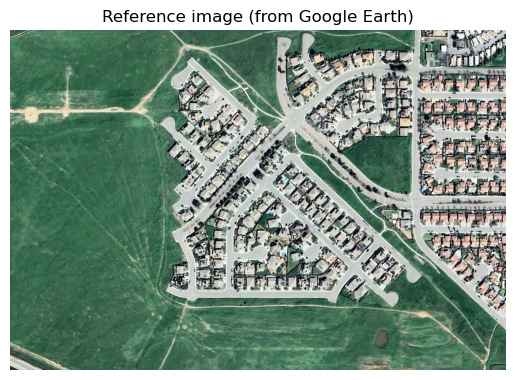

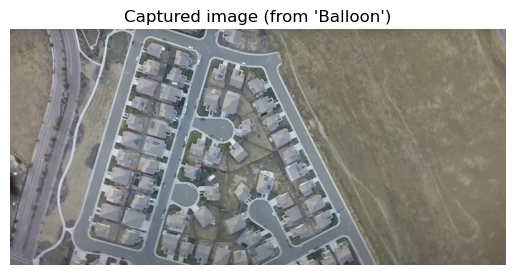

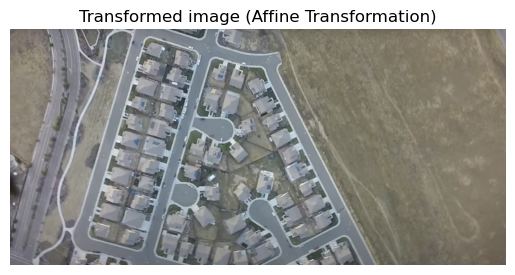

In [25]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Function to convert a BGR image to RGB for displaying correctly with matplotlib
def show_image(img, title="Image", cmap_type=None):
    if len(img.shape) == 3:  # Color image
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    else:  # Grayscale image
        img_rgb = img
        cmap_type = 'gray'
    plt.imshow(img_rgb, cmap=cmap_type)
    plt.title(title)
    plt.axis('off')  # Turn off axis numbers and ticks
    plt.show()

# set parameters
BLUR_KERNEL_SIZE = (3, 3) # Kernel size for Gaussian blur (denoising)
DOWNSAMPLE_FACTOR = 0.3 # Factor to downsample the images (0.5 reduces the resolution to half)
LOWES_RATIO_THRESHOLD = 0.1 # Lowe's ratio test threshold

# Load the images

#images/santa_nella_satellite_2009.png
#images/santa_nella_satellite_2010.png
#images/santa_nella_satellite_2011.png
#images/santa_nella_satellite_2013.png
#images/santa_nella_satellite_2024.png

referenceImage = cv2.imread('images/santa_nella_satellite_2024.png')
capturedImage = cv2.imread('images/santanella_balloon.png')

# Check if the images are loaded correctly
if referenceImage is None:
    print("Error loading reference image.")
if capturedImage is None:
    print("Error loading captured image.")

# Apply Gaussian Blur for de-noising
if capturedImage is not None and referenceImage is not None:
    capturedImageBlurred  = cv2.GaussianBlur(capturedImage, BLUR_KERNEL_SIZE, 0)
    referenceImageBlurred = cv2.GaussianBlur(referenceImage, BLUR_KERNEL_SIZE, 0)
else:
    print("One of the images failed to load, skipping blurring.")
    capturedImageBlurred  = capturedImage
    referenceImageBlurred = referenceImage
    

# Downsample images to reduce resolution and emphasize significant features
capturedImageBlurredResized = cv2.resize(capturedImageBlurred, (0,0), fx=DOWNSAMPLE_FACTOR, fy=DOWNSAMPLE_FACTOR)
referenceImageBlurredResized = cv2.resize(referenceImageBlurred, (0,0), fx=DOWNSAMPLE_FACTOR, fy=DOWNSAMPLE_FACTOR)

# Convert images to grayscale
capGray = cv2.cvtColor(capturedImageBlurredResized, cv2.COLOR_BGR2GRAY)
refGray = cv2.cvtColor(referenceImageBlurredResized, cv2.COLOR_BGR2GRAY)

# Initialize SIFT detector
sift = cv2.SIFT_create()

# Find the keypoints and descriptors with SIFT
capKeypoints, capDescriptors = sift.detectAndCompute(capGray, None)
refKeypoints, refDescriptors = sift.detectAndCompute(refGray, None)

# FLANN parameters
FLANN_INDEX_KDTREE = 1
index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
search_params = dict(checks=50)

flann = cv2.FlannBasedMatcher(index_params, search_params)

# Perform the matching
matches = flann.knnMatch(capDescriptors, refDescriptors, k=2)

# Apply Lowe's ratio test
good_matches = [m for m, n in matches if m.distance < LOWES_RATIO_THRESHOLD * n.distance]

# Ensure there are enough good matches to compute the transformation
if len(good_matches) > 3:  # Generally, a minimum of 3 matches is needed
    points1 = np.zeros((len(good_matches), 2), dtype=np.float32)
    points2 = np.zeros((len(good_matches), 2), dtype=np.float32)

    for i, match in enumerate(good_matches):
        points1[i, :] = capKeypoints[match.queryIdx].pt
        points2[i, :] = refKeypoints[match.trainIdx].pt

    # Compute the affine transformation matrix
    M, inliers = cv2.estimateAffinePartial2D(points1, points2)
    if M is not None:
        # Apply the affine transformation
        transformed_image = cv2.warpAffine(capturedImage, M, (referenceImage.shape[1], referenceImage.shape[0]))
        # Proceed to display or use the transformed_image
    else:
        print("Could not compute a valid transformation.")
else:
    print("Not enough matches are found - {}/{}".format(len(good_matches), 3))
    transformed_image = capturedImage  # Fallback to the original image if not enough matches


# Show the original and transformed image using matplotlib
show_image(referenceImage, "Reference image (from Google Earth)")
show_image(capturedImage, "Captured image (from 'Balloon')")
show_image(transformed_image, "Transformed image (Affine Transformation)")



# FAIL... so how do we fix?

Hypothesis: the image is too different for the algorithm to find matches.
    
Solution: let's act as if we have compass data and can perform processing on the HAB images to rotate them "close enough" to the reference satellite images.
    


# let's analyze some actual footage from HAB

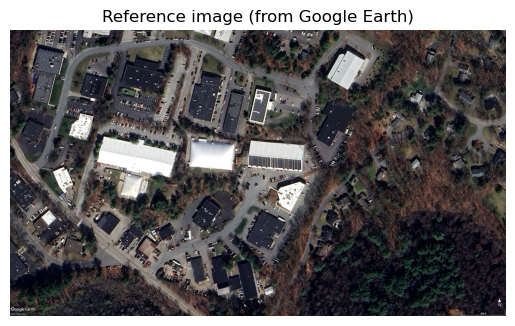

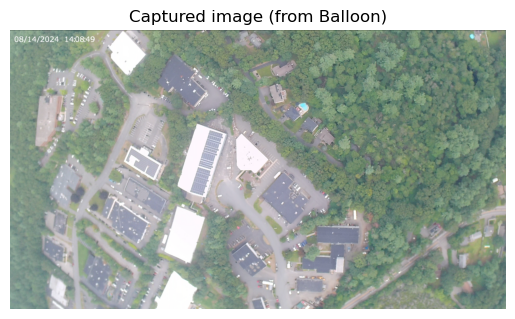

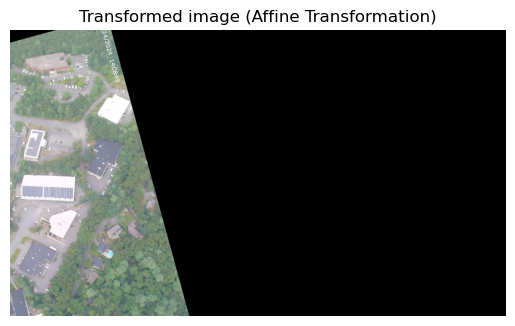

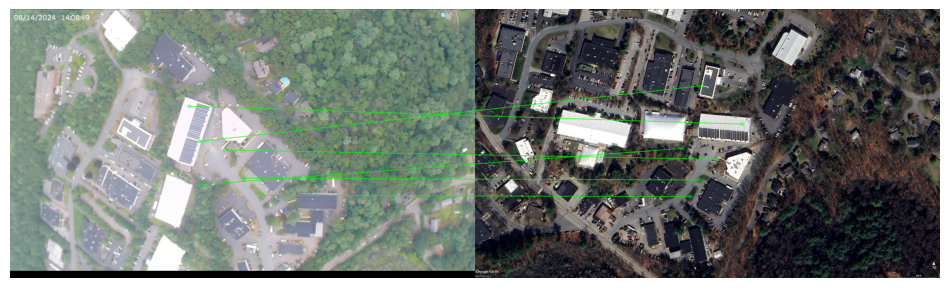

In [14]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Function to convert a BGR image to RGB for displaying correctly with matplotlib
def show_image(img, title="Image", cmap_type=None):
    if len(img.shape) == 3:  # Color image
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    else:  # Grayscale image
        img_rgb = img
        cmap_type = 'gray'
    plt.imshow(img_rgb, cmap=cmap_type)
    plt.title(title)
    plt.axis('off')  # Turn off axis numbers and ticks
    plt.show()

# set parameters
BLUR_KERNEL_SIZE = (3, 3) # Kernel size for Gaussian blur (denoising)
DOWNSAMPLE_FACTOR = 0.3 # Factor to downsample the images (0.5 reduces the resolution to half)
LOWES_RATIO_THRESHOLD = 0.6 # Lowe's ratio test threshold

# Load the images

#referenceImage = cv2.imread('/Users/vasteven/Projects/HAB/post-flight/GE NEST historic walk/ge_launch_2024APR.png')
referenceImage = cv2.imread('/Users/vasteven/Projects/HAB/post-flight/ge_nest_north.png')
capturedImage = cv2.imread('/Users/vasteven/Projects/HAB/post-flight/NEST from HAB.png')

# Check if the images are loaded correctly
if referenceImage is None:
    print("Error loading reference image.")
if capturedImage is None:
    print("Error loading captured image.")

# Apply Gaussian Blur for de-noising
if capturedImage is not None and referenceImage is not None:
    capturedImageBlurred  = cv2.GaussianBlur(capturedImage, BLUR_KERNEL_SIZE, 0)
    referenceImageBlurred = cv2.GaussianBlur(referenceImage, BLUR_KERNEL_SIZE, 0)
else:
    print("One of the images failed to load, skipping blurring.")
    capturedImageBlurred  = capturedImage
    referenceImageBlurred = referenceImage
    

# Downsample images to reduce resolution and emphasize significant features
capturedImageBlurredResized = cv2.resize(capturedImageBlurred, (0,0), fx=DOWNSAMPLE_FACTOR, fy=DOWNSAMPLE_FACTOR)
referenceImageBlurredResized = cv2.resize(referenceImageBlurred, (0,0), fx=DOWNSAMPLE_FACTOR, fy=DOWNSAMPLE_FACTOR)

# Convert images to grayscale
capGray = cv2.cvtColor(capturedImageBlurredResized, cv2.COLOR_BGR2GRAY)
refGray = cv2.cvtColor(referenceImageBlurredResized, cv2.COLOR_BGR2GRAY)

# Initialize SIFT detector
sift = cv2.SIFT_create()

# Find the keypoints and descriptors with SIFT
capKeypoints, capDescriptors = sift.detectAndCompute(capGray, None)
refKeypoints, refDescriptors = sift.detectAndCompute(refGray, None)

# FLANN parameters
FLANN_INDEX_KDTREE = 1
index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
search_params = dict(checks=50)

flann = cv2.FlannBasedMatcher(index_params, search_params)

# Perform the matching
matches = flann.knnMatch(capDescriptors, refDescriptors, k=2)

# Apply Lowe's ratio test
good_matches = [m for m, n in matches if m.distance < LOWES_RATIO_THRESHOLD * n.distance]

# Ensure there are enough good matches to compute the transformation
if len(good_matches) > 3:  # Generally, a minimum of 3 matches is needed
    points1 = np.zeros((len(good_matches), 2), dtype=np.float32)
    points2 = np.zeros((len(good_matches), 2), dtype=np.float32)

    for i, match in enumerate(good_matches):
        points1[i, :] = capKeypoints[match.queryIdx].pt
        points2[i, :] = refKeypoints[match.trainIdx].pt

    # Compute the affine transformation matrix
    M, inliers = cv2.estimateAffinePartial2D(points1, points2)
    if M is not None:
        # Apply the affine transformation
        transformed_image = cv2.warpAffine(capturedImage, M, (referenceImage.shape[1], referenceImage.shape[0]))
        # Proceed to display or use the transformed_image
    else:
        print("Could not compute a valid transformation.")
else:
    print("Not enough matches are found - {}/{}".format(len(good_matches), 3))
    transformed_image = capturedImage  # Fallback to the original image if not enough matches


# Show the original and transformed image using matplotlib
show_image(referenceImage, "Reference image (from Google Earth)")
show_image(capturedImage, "Captured image (from Balloon)")
show_image(transformed_image, "Transformed image (Affine Transformation)")


# Prepare to draw matches with thicker lines
# The line thickness can be controlled using the thickness parameter (increased from default)
img_matches = cv2.drawMatches(capturedImageBlurredResized, capKeypoints, referenceImageBlurredResized, refKeypoints, good_matches, None, matchColor=(0, 255, 0), singlePointColor=None, matchesMask=None, flags=2)

# Convert BGR to RGB for displaying with matplotlib
img_matches = cv2.cvtColor(img_matches, cv2.COLOR_BGR2RGB)

# Use matplotlib to display the image
plt.figure(figsize=(12, 6))
plt.imshow(img_matches)
plt.axis('off')  # Hide the axes
plt.show()




# show mapping

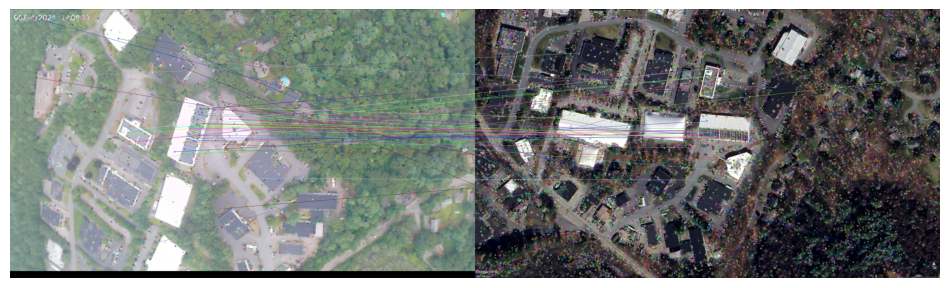

In [8]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Set parameters
BLUR_KERNEL_SIZE = (7, 7)  # Kernel size for Gaussian blur (denoising)
DOWNSAMPLE_FACTOR = 0.7    # Factor to downsample the images
LOWES_RATIO_THRESHOLD = 0.7  # Lowe's ratio test threshold

# Load the images
#referenceImage = cv2.imread('/Users/vasteven/Projects/HAB/post-flight/GE NEST historic walk/ge_launch_2024APR.png')
referenceImage = cv2.imread('/Users/vasteven/Projects/HAB/post-flight/ge_nest_north.png')
capturedImage = cv2.imread('/Users/vasteven/Projects/HAB/post-flight/NEST from HAB.png')

# Apply Gaussian Blur for de-noising
capturedImageBlurred = cv2.GaussianBlur(capturedImage, BLUR_KERNEL_SIZE, 0)
referenceImageBlurred = cv2.GaussianBlur(referenceImage, BLUR_KERNEL_SIZE, 0)

# Downsample images to reduce resolution and emphasize significant features
capturedImageBlurredResized = cv2.resize(capturedImageBlurred, (0,0), fx=DOWNSAMPLE_FACTOR, fy=DOWNSAMPLE_FACTOR)
referenceImageBlurredResized = cv2.resize(referenceImageBlurred, (0,0), fx=DOWNSAMPLE_FACTOR, fy=DOWNSAMPLE_FACTOR)

# Convert images to grayscale
capGray = cv2.cvtColor(capturedImageBlurredResized, cv2.COLOR_BGR2GRAY)
refGray = cv2.cvtColor(referenceImageBlurredResized, cv2.COLOR_BGR2GRAY)

# Initialize SIFT detector
sift = cv2.SIFT_create()

# Find the keypoints and descriptors with SIFT
capKeypoints, capDescriptors = sift.detectAndCompute(capGray, None)
refKeypoints, refDescriptors = sift.detectAndCompute(refGray, None)

# FLANN parameters
FLANN_INDEX_KDTREE = 1
index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
search_params = dict(checks=50)
flann = cv2.FlannBasedMatcher(index_params, search_params)

# Perform the matching
matches = flann.knnMatch(capDescriptors, refDescriptors, k=2)

# Apply Lowe's ratio test to find good matches
good_matches = [m for m, n in matches if m.distance < LOWES_RATIO_THRESHOLD * n.distance]

# Prepare to draw matches
img_matches = cv2.drawMatches(capturedImageBlurredResized, capKeypoints, referenceImageBlurredResized, refKeypoints, good_matches, None)

# Convert BGR to RGB for displaying with matplotlib
img_matches = cv2.cvtColor(img_matches, cv2.COLOR_BGR2RGB)

# Use matplotlib to display the image
plt.figure(figsize=(12, 6))
plt.imshow(img_matches)
plt.axis('off')  # Hide the axes
plt.show()


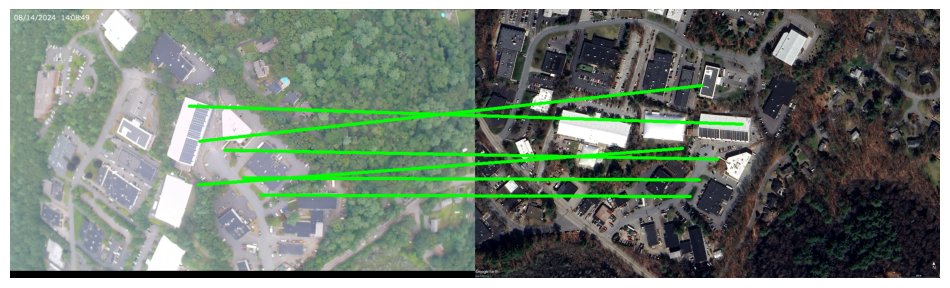

In [15]:
# Prepare to draw matches with custom line thickness
# Create a copy of the images side by side for custom drawing
h1, w1 = capturedImageBlurredResized.shape[:2]
h2, w2 = referenceImageBlurredResized.shape[:2]
img_matches = np.zeros((max(h1, h2), w1 + w2, 3), dtype=np.uint8)
img_matches[:h1, :w1] = capturedImageBlurredResized
img_matches[:h2, w1:w1+w2] = referenceImageBlurredResized

# Define custom line thickness
line_thickness = 5

# Draw the matches manually with thicker lines
for match in good_matches:
    # Get the keypoints from both images
    pt1 = tuple(np.round(capKeypoints[match.queryIdx].pt).astype(int))
    pt2 = tuple(np.round(refKeypoints[match.trainIdx].pt).astype(int) + np.array([w1, 0]))

    # Draw the line between the keypoints with the specified thickness
    cv2.line(img_matches, pt1, pt2, (0, 255, 0), thickness=line_thickness)

# Convert BGR to RGB for displaying with matplotlib
img_matches = cv2.cvtColor(img_matches, cv2.COLOR_BGR2RGB)

# Use matplotlib to display the image
plt.figure(figsize=(12, 6))
plt.imshow(img_matches)
plt.axis('off')  # Hide the axes
plt.show()


# now some comparisons (natick etc)

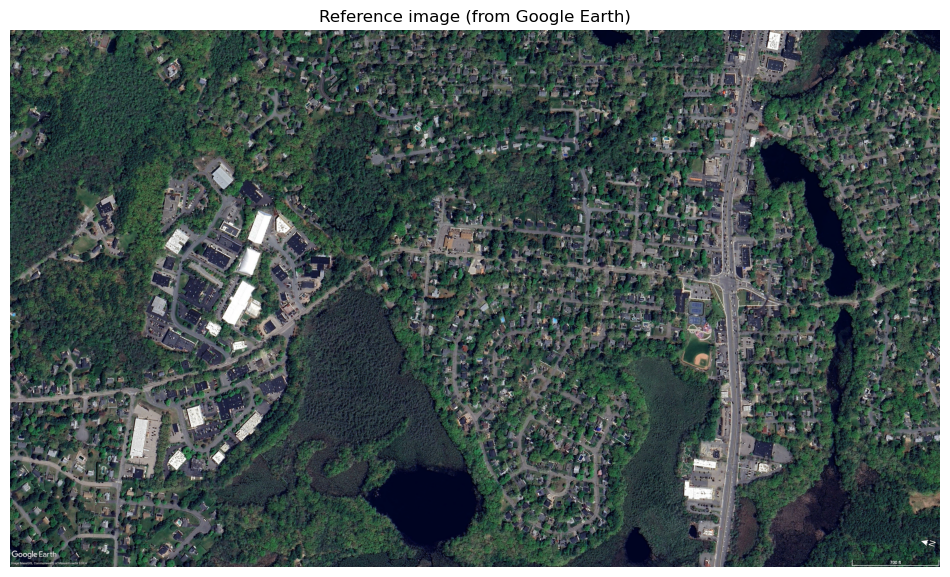

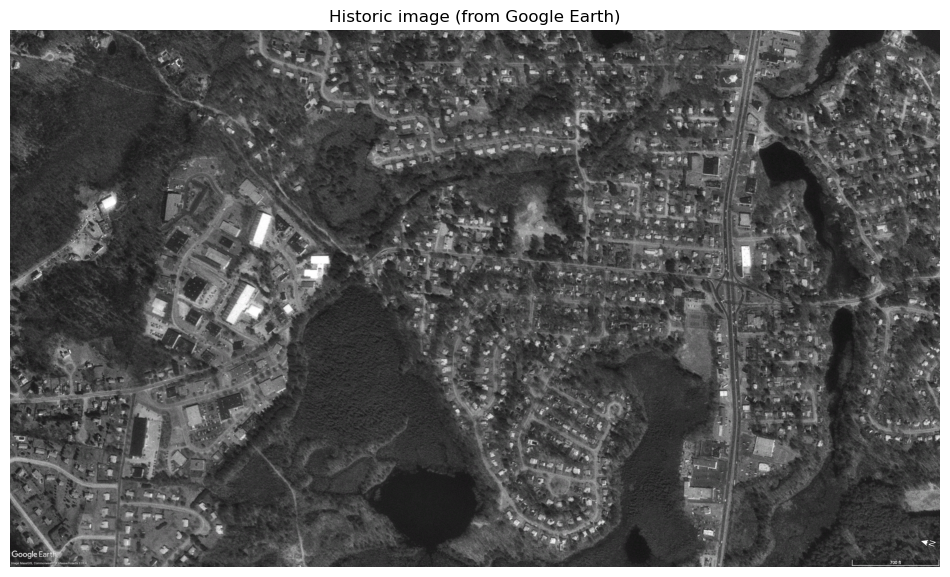

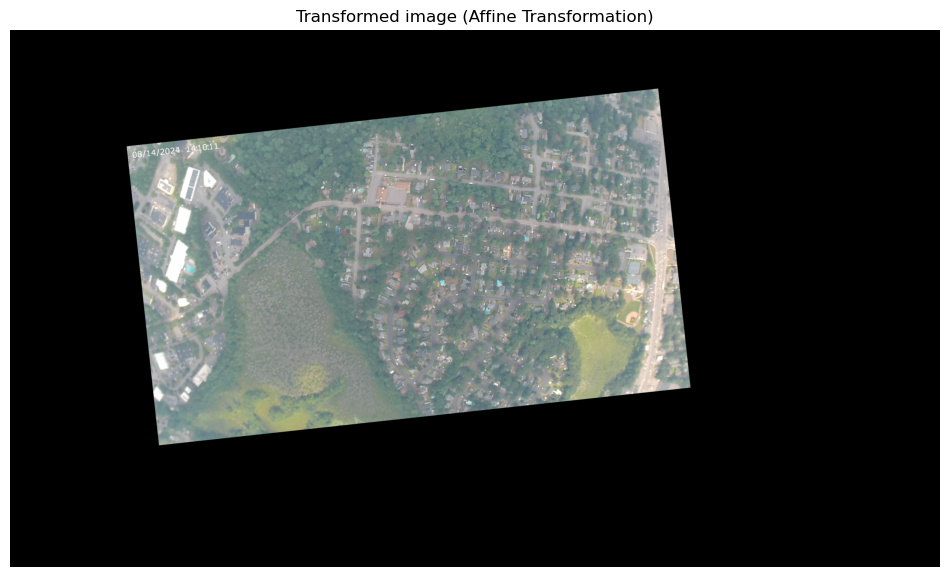

In [36]:
import cv2
import numpy as np
import matplotlib.pyplot as plt


def show_image(img, title="Image", cmap_type=None, figsize=(12, 12)):
    if len(img.shape) == 3:  # Color image
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    else:  # Grayscale image
        img_rgb = img
        cmap_type = 'gray'
    
    plt.figure(figsize=figsize)  # Set the figure size
    plt.imshow(img_rgb, cmap=cmap_type)
    plt.title(title)
    plt.axis('off')  # Turn off axis numbers and ticks
    plt.show()


# set parameters
BLUR_KERNEL_SIZE = (15, 15) # Kernel size for Gaussian blur (denoising)
DOWNSAMPLE_FACTOR = 0.7 # Factor to downsample the images (0.5 reduces the resolution to half)
LOWES_RATIO_THRESHOLD = 0.65 # Lowe's ratio test threshold

# Load the images

referenceImage = cv2.imread('/Users/vasteven/Projects/HAB/comparisons/01_natick_GE.png')
capturedImage = cv2.imread('/Users/vasteven/Projects/HAB/comparisons/01_natick_HAB.png')
ancientImage = cv2.imread('/Users/vasteven/Projects/HAB/comparisons/01_natick_GE_2003.png')


# Check if the images are loaded correctly
if referenceImage is None:
    print("Error loading reference image.")
if capturedImage is None:
    print("Error loading captured image.")

# Apply Gaussian Blur for de-noising
if capturedImage is not None and referenceImage is not None:
    capturedImageBlurred  = cv2.GaussianBlur(capturedImage, BLUR_KERNEL_SIZE, 0)
    referenceImageBlurred = cv2.GaussianBlur(referenceImage, BLUR_KERNEL_SIZE, 0)
else:
    print("One of the images failed to load, skipping blurring.")
    capturedImageBlurred  = capturedImage
    referenceImageBlurred = referenceImage
    

# Downsample images to reduce resolution and emphasize significant features
capturedImageBlurredResized = cv2.resize(capturedImageBlurred, (0,0), fx=DOWNSAMPLE_FACTOR, fy=DOWNSAMPLE_FACTOR)
referenceImageBlurredResized = cv2.resize(referenceImageBlurred, (0,0), fx=DOWNSAMPLE_FACTOR, fy=DOWNSAMPLE_FACTOR)

# Convert images to grayscale
capGray = cv2.cvtColor(capturedImageBlurredResized, cv2.COLOR_BGR2GRAY)
refGray = cv2.cvtColor(referenceImageBlurredResized, cv2.COLOR_BGR2GRAY)

# Initialize SIFT detector
sift = cv2.SIFT_create()

# Find the keypoints and descriptors with SIFT
capKeypoints, capDescriptors = sift.detectAndCompute(capGray, None)
refKeypoints, refDescriptors = sift.detectAndCompute(refGray, None)

# FLANN parameters
FLANN_INDEX_KDTREE = 1
index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
search_params = dict(checks=50)

flann = cv2.FlannBasedMatcher(index_params, search_params)

# Perform the matching
matches = flann.knnMatch(capDescriptors, refDescriptors, k=2)

# Apply Lowe's ratio test
good_matches = [m for m, n in matches if m.distance < LOWES_RATIO_THRESHOLD * n.distance]

# Ensure there are enough good matches to compute the transformation
if len(good_matches) > 3:  # Generally, a minimum of 3 matches is needed
    points1 = np.zeros((len(good_matches), 2), dtype=np.float32)
    points2 = np.zeros((len(good_matches), 2), dtype=np.float32)

    for i, match in enumerate(good_matches):
        points1[i, :] = capKeypoints[match.queryIdx].pt
        points2[i, :] = refKeypoints[match.trainIdx].pt

    # Compute the affine transformation matrix
    M, inliers = cv2.estimateAffinePartial2D(points1, points2)
    if M is not None:
        # Apply the affine transformation
        transformed_image = cv2.warpAffine(capturedImage, M, (referenceImage.shape[1], referenceImage.shape[0]))
        # Proceed to display or use the transformed_image
    else:
        print("Could not compute a valid transformation.")
else:
    print("Not enough matches are found - {}/{}".format(len(good_matches), 3))
    transformed_image = capturedImage  # Fallback to the original image if not enough matches


# Show the original and transformed image using matplotlib
show_image(referenceImage, "Reference image (from Google Earth)")
show_image(ancientImage, "Historic image (from Google Earth)")
#show_image(capturedImage, "Captured image (from Balloon)")
show_image(transformed_image, "Transformed image (Affine Transformation)")


# Prepare to draw matches with custom line thickness
# Create a copy of the images side by side for custom drawing
h1, w1 = capturedImageBlurredResized.shape[:2]
h2, w2 = referenceImageBlurredResized.shape[:2]
img_matches = np.zeros((max(h1, h2), w1 + w2, 3), dtype=np.uint8)
img_matches[:h1, :w1] = capturedImageBlurredResized
img_matches[:h2, w1:w1+w2] = referenceImageBlurredResized

# Define custom line thickness
line_thickness = 5

# Draw the matches manually with thicker lines
for match in good_matches:
    # Get the keypoints from both images
    pt1 = tuple(np.round(capKeypoints[match.queryIdx].pt).astype(int))
    pt2 = tuple(np.round(refKeypoints[match.trainIdx].pt).astype(int) + np.array([w1, 0]))

    # Draw the line between the keypoints with the specified thickness
    cv2.line(img_matches, pt1, pt2, (0, 255, 0), thickness=line_thickness)

# Convert BGR to RGB for displaying with matplotlib
img_matches = cv2.cvtColor(img_matches, cv2.COLOR_BGR2RGB)

# Use matplotlib to display the image
#plt.figure(figsize=(12, 6))
#plt.imshow(img_matches)
#plt.axis('off')  # Hide the axes
#plt.show()



Not enough matches are found - 0/3


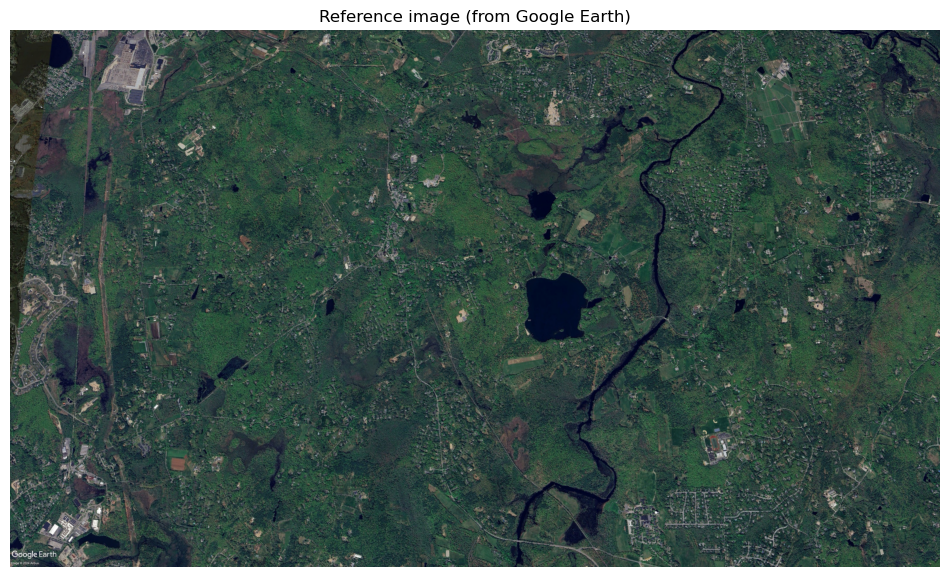

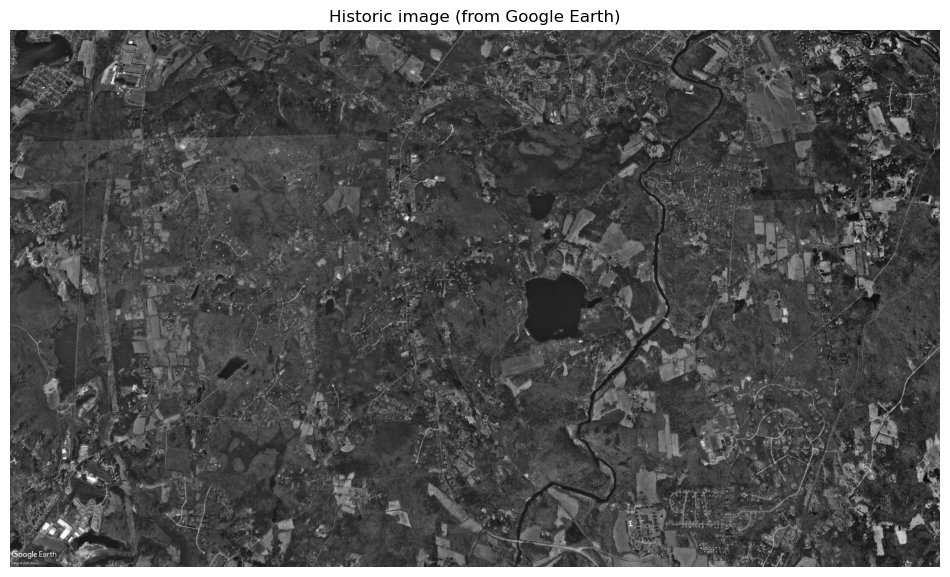

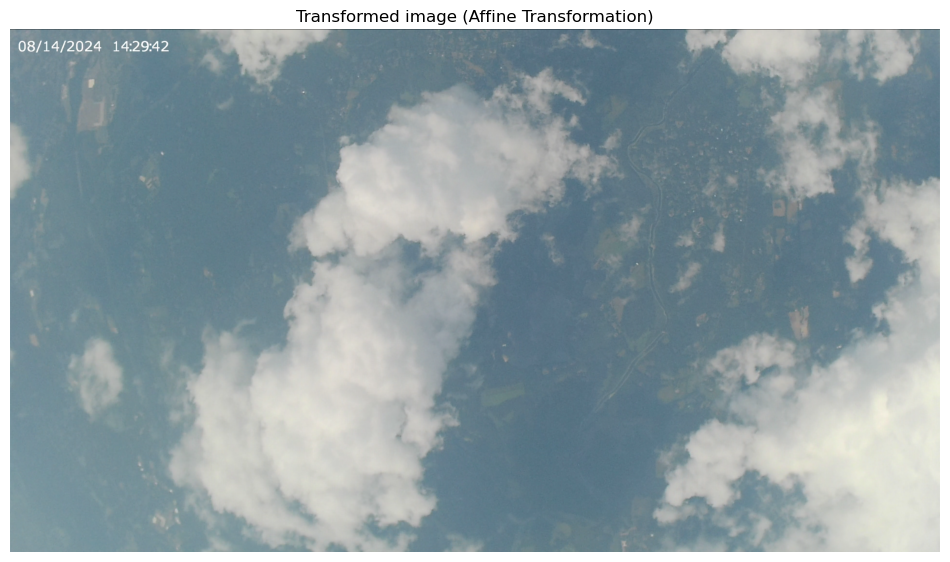

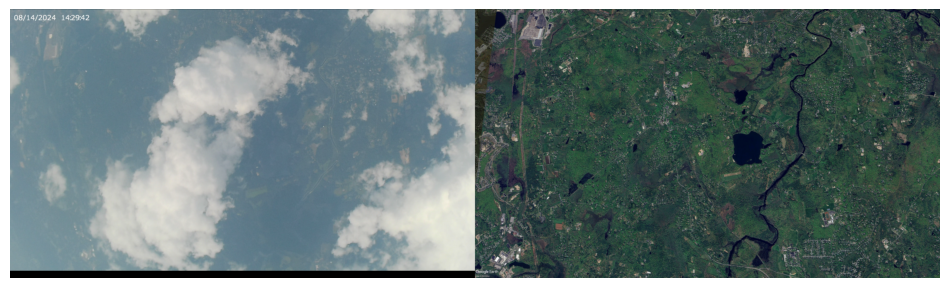

In [13]:
import cv2
import numpy as np
import matplotlib.pyplot as plt


def show_image(img, title="Image", cmap_type=None, figsize=(12, 12)):
    if len(img.shape) == 3:  # Color image
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    else:  # Grayscale image
        img_rgb = img
        cmap_type = 'gray'
    
    plt.figure(figsize=figsize)  # Set the figure size
    plt.imshow(img_rgb, cmap=cmap_type)
    plt.title(title)
    plt.axis('off')  # Turn off axis numbers and ticks
    plt.show()


# set parameters
BLUR_KERNEL_SIZE = (3, 3) # Kernel size for Gaussian blur (denoising)
DOWNSAMPLE_FACTOR = 0.5 # Factor to downsample the images (0.5 reduces the resolution to half)
LOWES_RATIO_THRESHOLD = 0.5 # Lowe's ratio test threshold

# Load the images

referenceImage = cv2.imread('/Users/vasteven/Projects/HAB/comparisons/03_natick_ge_2023.jpg')
capturedImage  = cv2.imread('/Users/vasteven/Projects/HAB/comparisons/03_natick_hab.png')
ancientImage   = cv2.imread('/Users/vasteven/Projects/HAB/comparisons/03_natick_ge_1995.jpg')


# Check if the images are loaded correctly
if referenceImage is None:
    print("Error loading reference image.")
if capturedImage is None:
    print("Error loading captured image.")

# Apply Gaussian Blur for de-noising
if capturedImage is not None and referenceImage is not None:
    capturedImageBlurred  = cv2.GaussianBlur(capturedImage, BLUR_KERNEL_SIZE, 0)
    referenceImageBlurred = cv2.GaussianBlur(referenceImage, BLUR_KERNEL_SIZE, 0)
else:
    print("One of the images failed to load, skipping blurring.")
    capturedImageBlurred  = capturedImage
    referenceImageBlurred = referenceImage
    

# Downsample images to reduce resolution and emphasize significant features
capturedImageBlurredResized = cv2.resize(capturedImageBlurred, (0,0), fx=DOWNSAMPLE_FACTOR, fy=DOWNSAMPLE_FACTOR)
referenceImageBlurredResized = cv2.resize(referenceImageBlurred, (0,0), fx=DOWNSAMPLE_FACTOR, fy=DOWNSAMPLE_FACTOR)

# Convert images to grayscale
capGray = cv2.cvtColor(capturedImageBlurredResized, cv2.COLOR_BGR2GRAY)
refGray = cv2.cvtColor(referenceImageBlurredResized, cv2.COLOR_BGR2GRAY)

# Initialize SIFT detector
sift = cv2.SIFT_create()

# Find the keypoints and descriptors with SIFT
capKeypoints, capDescriptors = sift.detectAndCompute(capGray, None)
refKeypoints, refDescriptors = sift.detectAndCompute(refGray, None)

# FLANN parameters
FLANN_INDEX_KDTREE = 1
index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
search_params = dict(checks=50)

flann = cv2.FlannBasedMatcher(index_params, search_params)

# Perform the matching
matches = flann.knnMatch(capDescriptors, refDescriptors, k=2)

# Apply Lowe's ratio test
good_matches = [m for m, n in matches if m.distance < LOWES_RATIO_THRESHOLD * n.distance]

# Ensure there are enough good matches to compute the transformation
if len(good_matches) > 3:  # Generally, a minimum of 3 matches is needed
    points1 = np.zeros((len(good_matches), 2), dtype=np.float32)
    points2 = np.zeros((len(good_matches), 2), dtype=np.float32)

    for i, match in enumerate(good_matches):
        points1[i, :] = capKeypoints[match.queryIdx].pt
        points2[i, :] = refKeypoints[match.trainIdx].pt

    # Compute the affine transformation matrix
    M, inliers = cv2.estimateAffinePartial2D(points1, points2)
    if M is not None:
        # Apply the affine transformation
        transformed_image = cv2.warpAffine(capturedImage, M, (referenceImage.shape[1], referenceImage.shape[0]))
        # Proceed to display or use the transformed_image
    else:
        print("Could not compute a valid transformation.")
else:
    print("Not enough matches are found - {}/{}".format(len(good_matches), 3))
    transformed_image = capturedImage  # Fallback to the original image if not enough matches


# Show the original and transformed image using matplotlib
show_image(referenceImage, "Reference image (from Google Earth)")
show_image(ancientImage, "Historic image (from Google Earth)")
#show_image(capturedImage, "Captured image (from Balloon)")
show_image(transformed_image, "Transformed image (Affine Transformation)")


# Prepare to draw matches with custom line thickness
# Create a copy of the images side by side for custom drawing
h1, w1 = capturedImageBlurredResized.shape[:2]
h2, w2 = referenceImageBlurredResized.shape[:2]
img_matches = np.zeros((max(h1, h2), w1 + w2, 3), dtype=np.uint8)
img_matches[:h1, :w1] = capturedImageBlurredResized
img_matches[:h2, w1:w1+w2] = referenceImageBlurredResized

# Define custom line thickness
line_thickness = 5

# Draw the matches manually with thicker lines
for match in good_matches:
    # Get the keypoints from both images
    pt1 = tuple(np.round(capKeypoints[match.queryIdx].pt).astype(int))
    pt2 = tuple(np.round(refKeypoints[match.trainIdx].pt).astype(int) + np.array([w1, 0]))

    # Draw the line between the keypoints with the specified thickness
    cv2.line(img_matches, pt1, pt2, (0, 255, 0), thickness=line_thickness)

# Convert BGR to RGB for displaying with matplotlib
img_matches = cv2.cvtColor(img_matches, cv2.COLOR_BGR2RGB)

# Use matplotlib to display the image
plt.figure(figsize=(12, 6))
plt.imshow(img_matches)
plt.axis('off')  # Hide the axes
plt.show()

